# COVID-19 Data Analysis and Visualization

## 1. Data Loading and Initial Inspection

In [3]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings("ignore")

### Load the datasets

In [5]:
print("Loading datasets...")
full_grouped = pd.read_csv(r"C:\Users\user\Downloads\archive (8)\full_grouped.csv")
day_wise = pd.read_csv(r"C:\Users\user\Downloads\archive (8)\day_wise.csv")

Loading datasets...


### Display initial information about the datasets

In [7]:
print("\nInitial Dataset Information:")
print("\nFull Grouped Dataset:")
full_grouped.info()


Initial Dataset Information:

Full Grouped Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Date            35156 non-null  object
 1   Country/Region  35156 non-null  object
 2   Confirmed       35156 non-null  int64 
 3   Deaths          35156 non-null  int64 
 4   Recovered       35156 non-null  int64 
 5   Active          35156 non-null  int64 
 6   New cases       35156 non-null  int64 
 7   New deaths      35156 non-null  int64 
 8   New recovered   35156 non-null  int64 
 9   WHO Region      35156 non-null  object
dtypes: int64(7), object(3)
memory usage: 2.7+ MB


In [8]:
print("\nDay Wise Dataset:")
print(day_wise.info())


Day Wise Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Date                    188 non-null    object 
 1   Confirmed               188 non-null    int64  
 2   Deaths                  188 non-null    int64  
 3   Recovered               188 non-null    int64  
 4   Active                  188 non-null    int64  
 5   New cases               188 non-null    int64  
 6   New deaths              188 non-null    int64  
 7   New recovered           188 non-null    int64  
 8   Deaths / 100 Cases      188 non-null    float64
 9   Recovered / 100 Cases   188 non-null    float64
 10  Deaths / 100 Recovered  188 non-null    float64
 11  No. of countries        188 non-null    int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 17.8+ KB
None


### Check for missing values

In [10]:
print("\nMissing Values in Full Grouped Dataset:")
full_grouped.isnull().sum()


Missing Values in Full Grouped Dataset:


Date              0
Country/Region    0
Confirmed         0
Deaths            0
Recovered         0
Active            0
New cases         0
New deaths        0
New recovered     0
WHO Region        0
dtype: int64

In [11]:
print("\nMissing Values in Day Wise Dataset:")
day_wise.isnull().sum()


Missing Values in Day Wise Dataset:


Date                      0
Confirmed                 0
Deaths                    0
Recovered                 0
Active                    0
New cases                 0
New deaths                0
New recovered             0
Deaths / 100 Cases        0
Recovered / 100 Cases     0
Deaths / 100 Recovered    0
No. of countries          0
dtype: int64

In [12]:
day_wise.duplicated().sum()

0

In [13]:
full_grouped.duplicated().sum()

0

## 2. Data Preprocessing and Cleaning

In [15]:
def clean_full_grouped(df):
    df = df.copy()
    df['Date'] = pd.to_datetime(df['Date'])
    df['Case Fatality Rate'] = ((df['Deaths'] / df['Confirmed']) * 100)
    df['Recovery Rate'] = ((df['Recovered'] / df['Confirmed']) * 100)
    df = df.drop_duplicates()
    df = df.sort_values(['Date', 'Country/Region'])
    return df

def clean_day_wise(df):
    df = df.copy()
    df['Date'] = pd.to_datetime(df['Date'])
    df['Active Rate'] = ((df['Active'] / df['Confirmed']) * 100)
    df['Daily Growth Rate'] = ((df['New cases'] / df['Confirmed'].shift(1)) * 100)
    df = df.drop_duplicates(subset=['Date'])
    df = df.sort_values('Date')
    return df

In [16]:
print("\nCleaning datasets...")
full_grouped_clean = clean_full_grouped(full_grouped)
day_wise_clean = clean_day_wise(day_wise)


Cleaning datasets...


In [17]:
print("\nCleaned Dataset Information:")
print("\nCleaned Full Grouped Dataset:")
full_grouped_clean.info()


Cleaned Dataset Information:

Cleaned Full Grouped Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                35156 non-null  datetime64[ns]
 1   Country/Region      35156 non-null  object        
 2   Confirmed           35156 non-null  int64         
 3   Deaths              35156 non-null  int64         
 4   Recovered           35156 non-null  int64         
 5   Active              35156 non-null  int64         
 6   New cases           35156 non-null  int64         
 7   New deaths          35156 non-null  int64         
 8   New recovered       35156 non-null  int64         
 9   WHO Region          35156 non-null  object        
 10  Case Fatality Rate  27138 non-null  float64       
 11  Recovery Rate       27138 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(7

In [18]:
print("\nCleaned Day Wise Dataset:")
day_wise_clean.info()


Cleaned Day Wise Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    188 non-null    datetime64[ns]
 1   Confirmed               188 non-null    int64         
 2   Deaths                  188 non-null    int64         
 3   Recovered               188 non-null    int64         
 4   Active                  188 non-null    int64         
 5   New cases               188 non-null    int64         
 6   New deaths              188 non-null    int64         
 7   New recovered           188 non-null    int64         
 8   Deaths / 100 Cases      188 non-null    float64       
 9   Recovered / 100 Cases   188 non-null    float64       
 10  Deaths / 100 Recovered  188 non-null    float64       
 11  No. of countries        188 non-null    int64         
 12  Active Rate            

### Data Quality Checks

In [20]:
def perform_data_quality_checks(df, dataset_name):
    print(f"\nPerforming data quality checks for {dataset_name}:")
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    for col in numeric_cols:
        neg_count = (df[col] < 0).sum()
        if neg_count > 0:
            print(f"Warning: {neg_count} negative values found in {col}")
    if 'Date' in df.columns:
        future_dates = df[df['Date'] > pd.Timestamp.now()].shape[0]
        if future_dates > 0:
            print(f"Warning: {future_dates} future dates found")
    if 'Confirmed' in df.columns and 'Deaths' in df.columns:
        invalid_deaths = (df['Deaths'] > df['Confirmed']).sum()
        if invalid_deaths > 0:
            print(f"Warning: {invalid_deaths} cases where deaths exceed confirmed cases")
    if 'Recovered' in df.columns and 'Confirmed' in df.columns:
        invalid_recoveries = (df['Recovered'] > df['Confirmed']).sum()
        if invalid_recoveries > 0:
            print(f"Warning: {invalid_recoveries} cases where recoveries exceed confirmed cases")

perform_data_quality_checks(full_grouped_clean, "Full Grouped Dataset")
perform_data_quality_checks(day_wise_clean, "Day Wise Dataset")


Performing data quality checks for Full Grouped Dataset:

Performing data quality checks for Day Wise Dataset:


## 3. Exploratory Data Analysis

### Summary statistics

In [23]:
print("\nSummary Statistics for Full Grouped Dataset:")
full_grouped_clean.describe()


Summary Statistics for Full Grouped Dataset:


,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Case Fatality Rate,Recovery Rate
count,35156,3.515600e+04,35156.000000,3.515600e+04,3.515600e+04,35156.00000,35156.000000,35156.000000,27138.000000,27138.000000
mean,2020-04-24 12:00:00,2.356663e+04,1234.068239,1.104813e+04,1.128443e+04,469.36375,18.603339,269.315593,3.190756,41.374177
min,2020-01-22 00:00:00,0.000000e+00,0.000000,0.000000e+00,-2.000000e+00,0.00000,-1918.000000,-16298.000000,0.000000,0.000000
25%,2020-03-08 18:00:00,1.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.000000,0.290706,9.027680
50%,2020-04-24 12:00:00,2.500000e+02,4.000000,3.300000e+01,8.500000e+01,2.00000,0.000000,0.000000,1.871809,36.908318
75%,2020-06-10 06:00:00,3.640250e+03,78.250000,1.286250e+03,1.454000e+03,75.00000,1.000000,20.000000,4.309399,71.428571
max,2020-07-27 00:00:00,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,77255.00000,3887.000000,140050.000000,100.000000,100.187091
std,NaN,1.499818e+05,7437.238354,6.454640e+04,8.997149e+04,3005.86754,115.706351,2068.063852,4.551847,33.517012


In [24]:
print("\nSummary Statistics for Day Wise Dataset:")
day_wise_clean.describe()


Summary Statistics for Day Wise Dataset:


,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries,Active Rate,Daily Growth Rate
count,188,1.880000e+02,188.000000,1.880000e+02,1.880000e+02,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,187.000000
mean,2020-04-24 12:00:00,4.406960e+06,230770.760638,2.066001e+06,2.110188e+06,87771.021277,3478.824468,50362.015957,4.860638,34.343936,22.104521,144.351064,60.795159,6.055761
min,2020-01-22 00:00:00,5.550000e+02,17.000000,2.800000e+01,5.100000e+02,0.000000,0.000000,0.000000,2.040000,1.710000,6.260000,6.000000,38.581158,0.414278
25%,2020-03-08 18:00:00,1.121910e+05,3935.000000,6.044125e+04,5.864175e+04,5568.500000,250.750000,2488.250000,3.510000,22.785000,9.650000,101.250000,45.954394,1.801910
50%,2020-04-24 12:00:00,2.848733e+06,204190.000000,7.847840e+05,1.859759e+06,81114.000000,4116.000000,30991.500000,4.850000,35.680000,15.380000,184.000000,58.265874,2.310842
75%,2020-06-10 06:00:00,7.422046e+06,418634.500000,3.416396e+06,3.587015e+06,131502.500000,5346.000000,79706.250000,6.297500,48.945000,25.342500,187.000000,71.582156,5.854738
max,2020-07-27 00:00:00,1.648048e+07,654036.000000,9.468087e+06,6.358362e+06,282756.000000,9966.000000,284394.000000,7.180000,57.450000,134.430000,187.000000,96.210833,90.570550
std,NaN,4.757988e+06,217929.094183,2.627976e+06,1.969670e+06,75295.293255,2537.735652,56090.892479,1.579541,16.206159,22.568307,65.175979,16.659188,10.260061


### Top 10 countries by total cases

In [26]:
top_10_countries = full_grouped_clean.groupby('Country/Region')['Confirmed'].max().sort_values(ascending=False).head(10)
print("\nTop 10 Countries by Total COVID-19 Cases:")
print(top_10_countries)


Top 10 Countries by Total COVID-19 Cases:
Country/Region
US                4290259
Brazil            2442375
India             1480073
Russia             816680
South Africa       452529
Mexico             395489
Peru               389717
Chile              347923
United Kingdom     301708
Iran               293606
Name: Confirmed, dtype: int64


### Global totals

In [28]:
latest_global = day_wise_clean.iloc[-1]
print("\nLatest Global COVID-19 Statistics:")
print(f"Total Cases: {latest_global['Confirmed']:,}")
print(f"Total Deaths: {latest_global['Deaths']:,}")
print(f"Total Recovered: {latest_global['Recovered']:,}")
print(f"Active Cases: {latest_global['Active']:,}")


Latest Global COVID-19 Statistics:
Total Cases: 16,480,485
Total Deaths: 654,036
Total Recovered: 9,468,087
Active Cases: 6,358,362


## 4. Static Visualizations

### 4.1 Global COVID-19 Trends

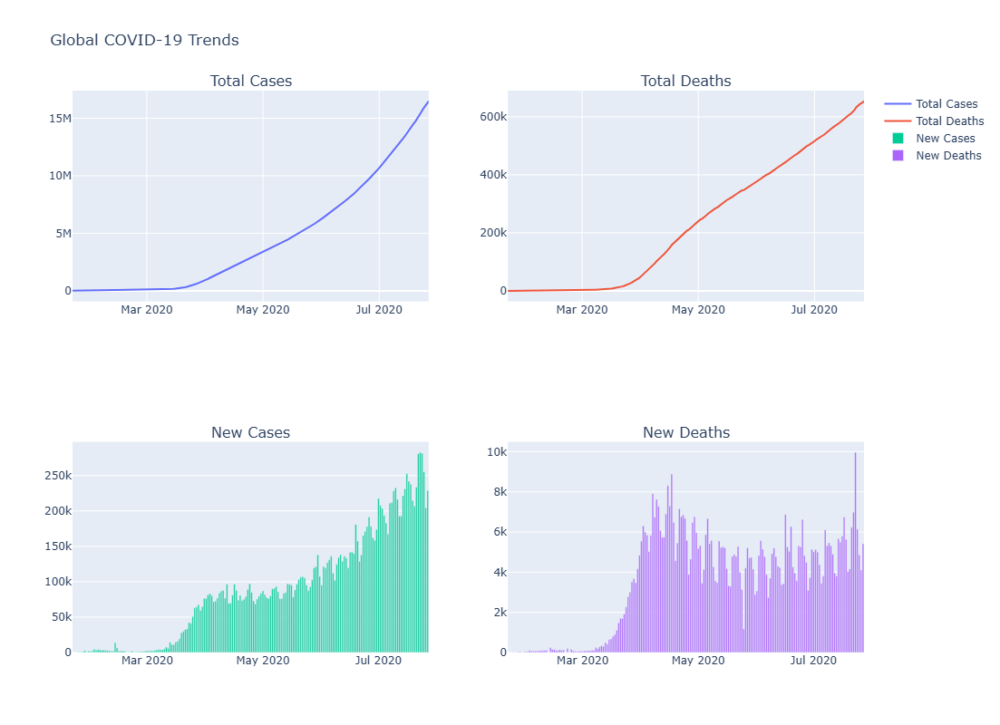

In [31]:
fig = make_subplots(rows=2, cols=2, subplot_titles=("Total Cases", "Total Deaths", "New Cases", "New Deaths"))

fig.add_trace(go.Scatter(x=day_wise_clean['Date'], y=day_wise_clean['Confirmed'], name='Total Cases'), row=1, col=1)
fig.add_trace(go.Scatter(x=day_wise_clean['Date'], y=day_wise_clean['Deaths'], name='Total Deaths'), row=1, col=2)
fig.add_trace(go.Bar(x=day_wise_clean['Date'], y=day_wise_clean['New cases'], name='New Cases'), row=2, col=1)
fig.add_trace(go.Bar(x=day_wise_clean['Date'], y=day_wise_clean['New deaths'], name='New Deaths'), row=2, col=2)

fig.update_layout(height=800, width=1200, title_text="Global COVID-19 Trends")
fig.show()

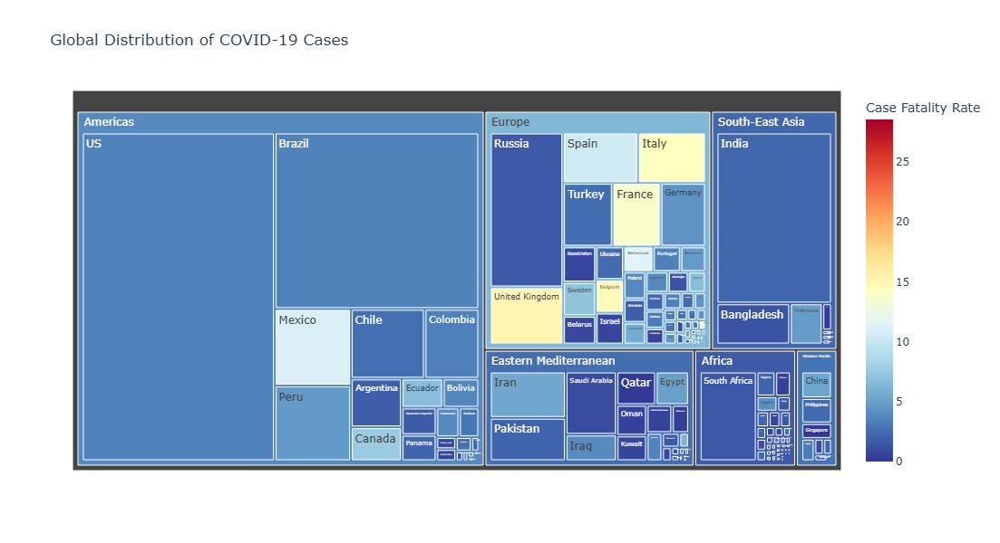

In [32]:
latest_data = full_grouped_clean.loc[full_grouped_clean.groupby('Country/Region')['Date'].idxmax()]
fig = px.treemap(latest_data, 
                 path=['WHO Region', 'Country/Region'], 
                 values='Confirmed',
                 color='Case Fatality Rate',
                 color_continuous_scale='RdYlBu_r',
                 title='Global Distribution of COVID-19 Cases',
                 hover_data=['Confirmed', 'Deaths', 'Recovered'])

fig.update_layout(
    template='plotly_white',
    width=1000,
    height=600,
)

fig.show()

### 4.2 Top 10 Countries by Total Cases

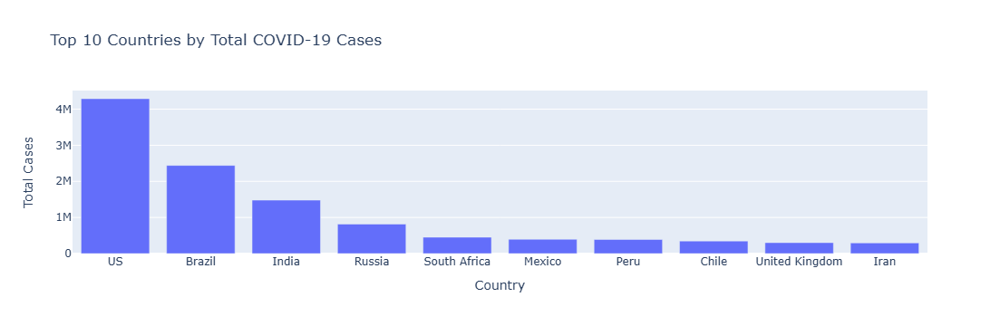

In [34]:
fig = px.bar(x=top_10_countries.index, y=top_10_countries.values, 
             labels={'x': 'Country', 'y': 'Total Cases'},
             title='Top 10 Countries by Total COVID-19 Cases')
fig.show()

### 4.2 Top 20 Countries by Confirmed Cases

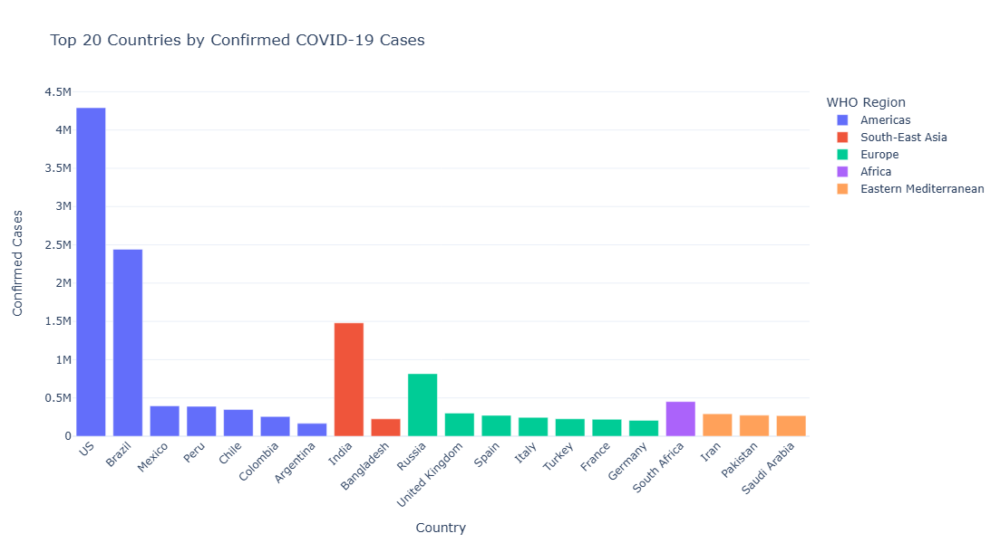

In [36]:
top_20_countries = latest_data.nlargest(20, 'Confirmed')

fig = px.bar(top_20_countries, 
             x='Country/Region', 
             y='Confirmed',
             color='WHO Region',
             title='Top 20 Countries by Confirmed COVID-19 Cases',
             labels={'Confirmed': 'Confirmed Cases'},
             hover_data=['Deaths', 'Recovered', 'Active'])

fig.update_layout(
    template='plotly_white',
    xaxis_title="Country",
    yaxis_title="Confirmed Cases",
    xaxis_tickangle=-45,
    width=1000,
    height=600
)

fig.show()

### 4.3 Case Fatality Rate by Country

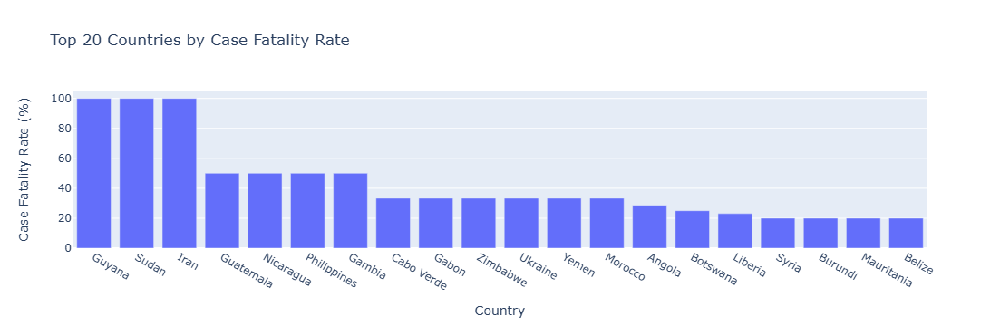

In [38]:
cfr_by_country = full_grouped_clean.groupby('Country/Region')['Case Fatality Rate'].max().sort_values(ascending=False).head(20)
fig = px.bar(x=cfr_by_country.index, y=cfr_by_country.values,
             labels={'x': 'Country', 'y': 'Case Fatality Rate (%)'},
             title='Top 20 Countries by Case Fatality Rate')
fig.show()

### 4.4 Recovery Rate Over Time

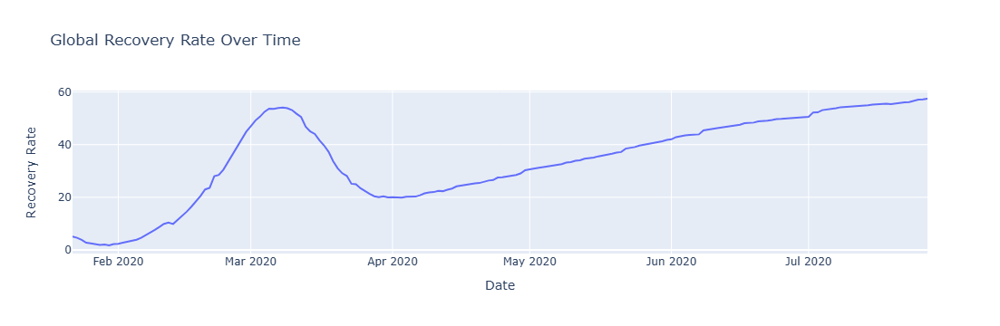

In [40]:
day_wise_clean['Recovery Rate'] = day_wise_clean['Recovered'] / day_wise_clean['Confirmed'] * 100
fig = px.line(day_wise_clean, x='Date', y='Recovery Rate', 
              title='Global Recovery Rate Over Time')
fig.show()

### 4.5 Confirmed Cases by WHO Region

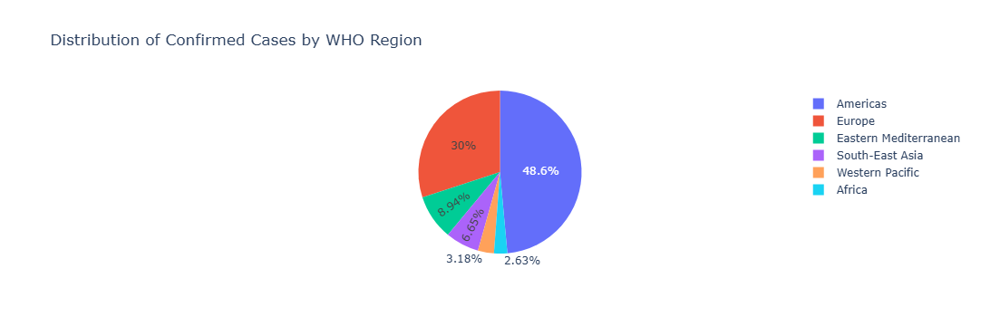

In [42]:
cases_by_region = full_grouped_clean.groupby('WHO Region')['Confirmed'].sum().sort_values(ascending=False)
fig = px.pie(values=cases_by_region.values, names=cases_by_region.index, 
             title='Distribution of Confirmed Cases by WHO Region')
fig.show()

## 5. Animated Visualizations

### 5.1 Animated Bubble Chart showing Cases vs Deaths over time

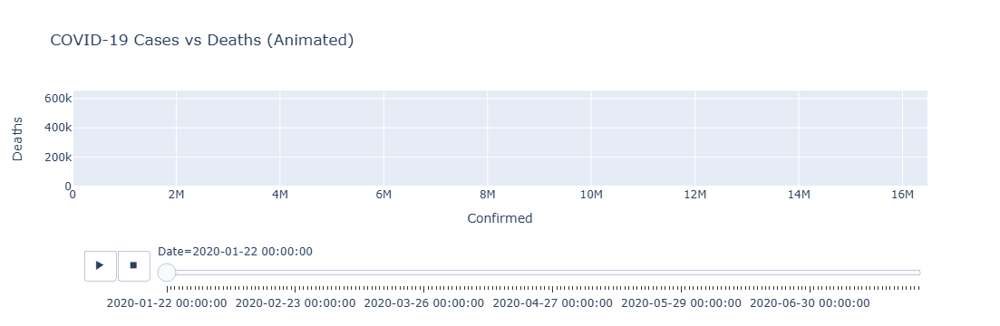

In [45]:
fig = px.scatter(day_wise_clean, 
                 x="Confirmed", 
                 y="Deaths",
                 animation_frame="Date",
                 animation_group="Date",
                 size="Recovered",
                 hover_name="Date",
                 size_max=60,
                 range_x=[0, day_wise_clean['Confirmed'].max()],
                 range_y=[0, day_wise_clean['Deaths'].max()],
                 color_continuous_scale='viridis',
                 title="COVID-19 Cases vs Deaths (Animated)")
fig.show()

### 5.2 Animated Choropleth Map

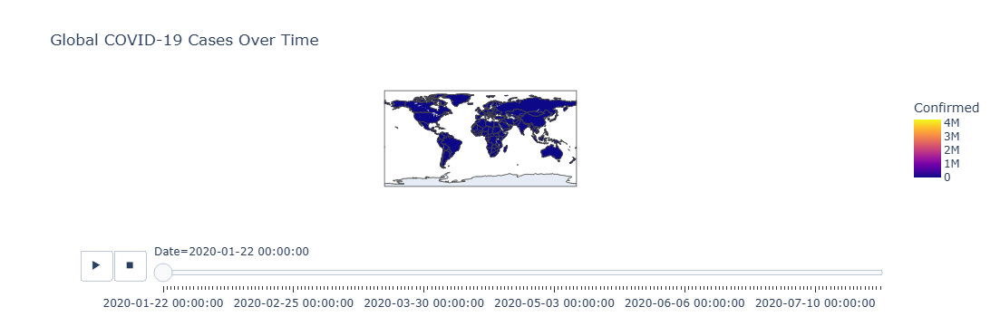

In [47]:
fig = px.choropleth(full_grouped_clean,
                    locations='Country/Region',
                    locationmode='country names',
                    color='Confirmed',
                    animation_frame='Date',
                    range_color=[0, full_grouped_clean['Confirmed'].max()],
                    color_continuous_scale='Plasma',
                    title='Global COVID-19 Cases Over Time')
fig.show()

### 5.3 Animated Bar Race Chart

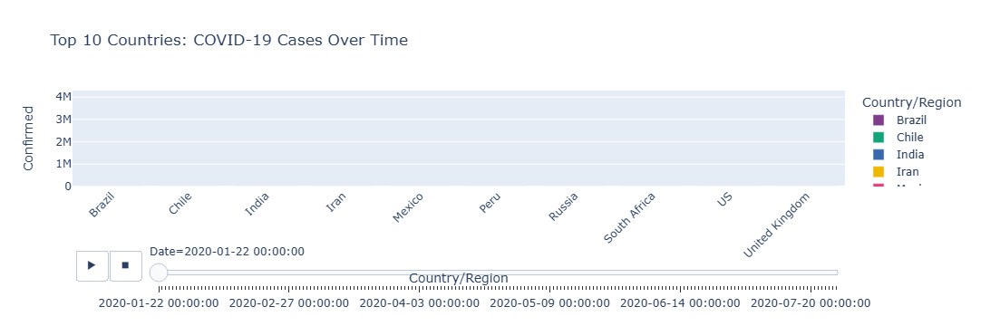

In [49]:
top_10_countries = full_grouped_clean.groupby('Country/Region')['Confirmed'].max().nlargest(10).index
filtered_data = full_grouped_clean[full_grouped_clean['Country/Region'].isin(top_10_countries)]

fig = px.bar(filtered_data,
             x='Country/Region',
             y='Confirmed',
             animation_frame='Date',
             animation_group='Country/Region',
             color='Country/Region',
             range_y=[0, filtered_data['Confirmed'].max()],
             title='Top 10 Countries: COVID-19 Cases Over Time',
             color_discrete_sequence=px.colors.qualitative.Bold)

fig.update_layout(
    showlegend=True,
    xaxis_tickangle=-45
)
fig.show()

### 5.4 3D Scatter Plot

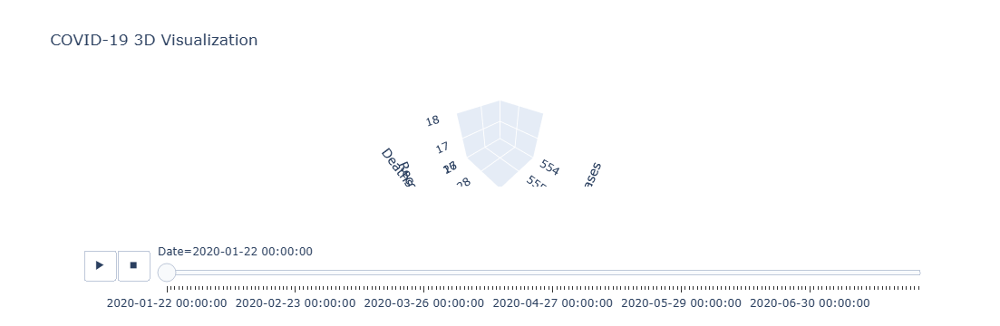

In [51]:
fig = px.scatter_3d(day_wise_clean,
                    x='Confirmed',
                    y='Recovered',
                    z='Deaths',
                    animation_frame='Date',
                    size='New cases',
                    hover_name='Date',
                    size_max=50,
                    color_continuous_scale='Viridis',
                    title='COVID-19 3D Visualization')

fig.update_layout(
    scene=dict(
        xaxis_title='Confirmed Cases',
        yaxis_title='Recovered Cases',
        zaxis_title='Deaths'
    )
)
fig.show()

### 5.5 Daily New Cases vs. Daily New Deaths

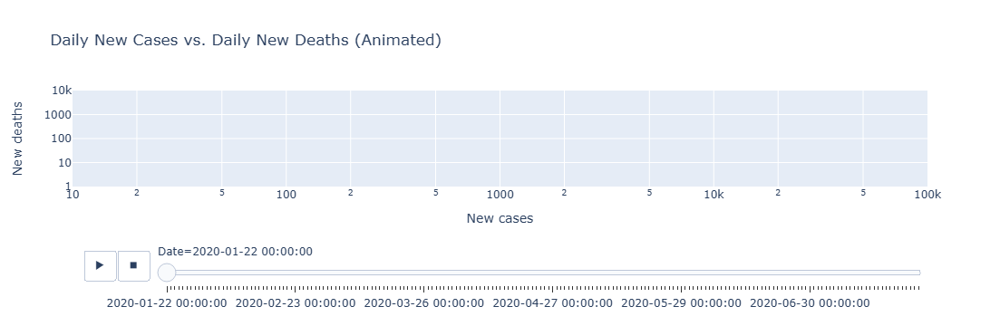

In [53]:
fig = px.scatter(day_wise_clean, 
                 x="New cases", 
                 y="New deaths", 
                 animation_frame="Date", 
                 animation_group="Date",
                 size="New cases", 
                 hover_name="Date", 
                 log_x=True, 
                 log_y=True,
                 size_max=55, 
                 range_x=[10,100000], 
                 range_y=[1,10000],
                 title="Daily New Cases vs. Daily New Deaths (Animated)")

fig.show()

### 5.6 Recovery Rate vs. Case Fatality Rate by Country

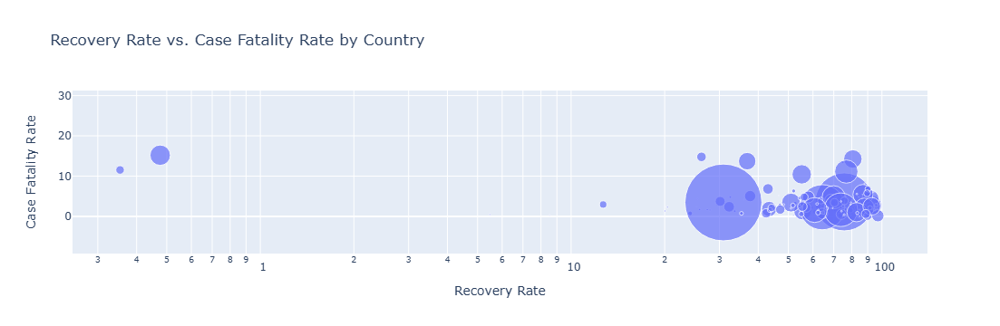

In [55]:
latest_data = full_grouped_clean.loc[full_grouped_clean.groupby('Country/Region')['Date'].idxmax()]
fig = px.scatter(latest_data, x="Recovery Rate", y="Case Fatality Rate", 
                 size="Confirmed", hover_name="Country/Region",
                 log_x=True, size_max=60, 
                 color_continuous_scale=px.colors.sequential.Viridis,
                 title="Recovery Rate vs. Case Fatality Rate by Country")

fig.show()

### 5.7 Case Fatality Rate Heatmap

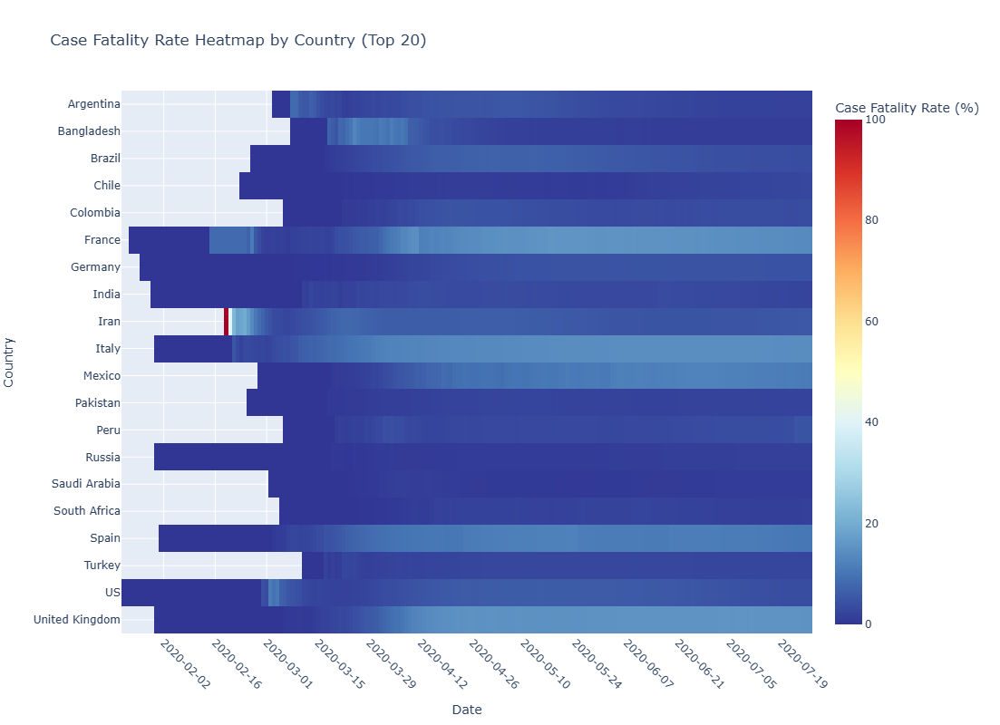

In [57]:
# Assuming full_grouped_clean is our cleaned dataset
# Let's get the top 20 countries by total confirmed cases
top_20_countries = full_grouped_clean.groupby('Country/Region')['Confirmed'].max().nlargest(20).index

heatmap_data = full_grouped_clean[full_grouped_clean['Country/Region'].isin(top_20_countries)]

pivot_data = heatmap_data.pivot(index='Country/Region', columns='Date', values='Case Fatality Rate')


fig_static = px.imshow(pivot_data,
                       labels=dict(x="Date", y="Country", color="Case Fatality Rate (%)"),
                       x=pivot_data.columns,
                       y=pivot_data.index,
                       color_continuous_scale="RdYlBu_r",
                       title="Case Fatality Rate Heatmap by Country (Top 20)")

fig_static.update_layout(
    xaxis_nticks=20,  
    yaxis_title="Country",
    xaxis_title="Date",
    coloraxis_colorbar=dict(title="Case Fatality Rate (%)"),
    height=800,
    width=1200
)

# Improve x-axis labels
fig_static.update_xaxes(tickangle=45, tickformat="%Y-%m-%d")

fig_static.show()

### 5.8 Stacked Area Chart of Cases, Deaths, and Recoveries

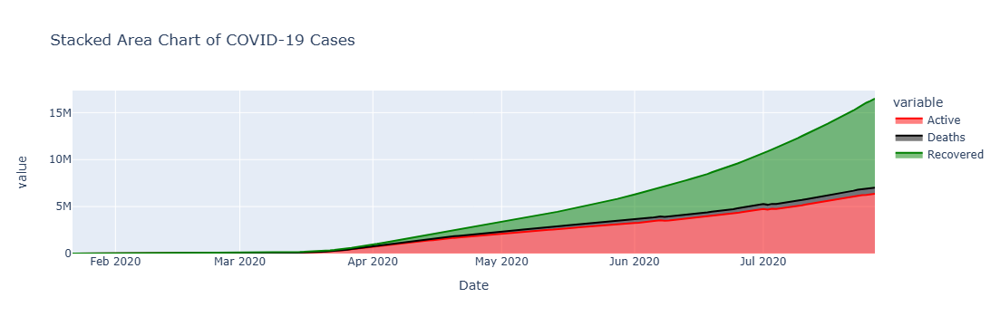

In [59]:
fig = px.area(day_wise_clean, x="Date", y=["Active", "Deaths", "Recovered"],
               title="Stacked Area Chart of COVID-19 Cases",
               color_discrete_map={"Active": "red", "Deaths": "black", "Recovered": "green"})
fig.show()

### 5.9 Sunburst Chart of Cases by Region and Top Countries

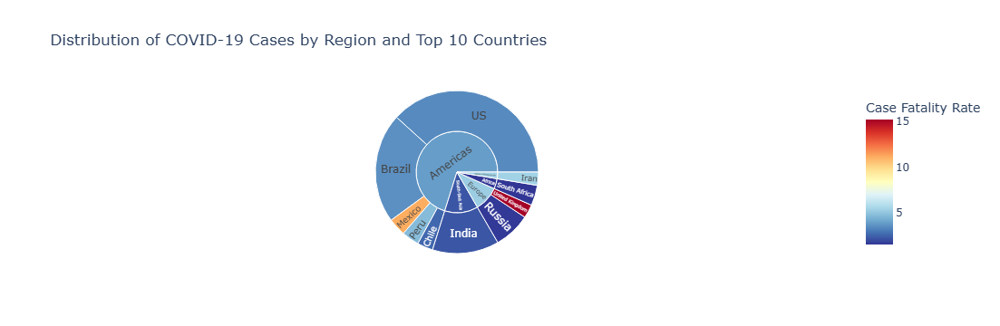

In [61]:
top_countries = full_grouped_clean.groupby('Country/Region')['Confirmed'].max().nlargest(10).index
filtered_data = full_grouped_clean[
    (full_grouped_clean['Country/Region'].isin(top_countries)) & 
    (full_grouped_clean['Date'] == full_grouped_clean['Date'].max())
]

fig = px.sunburst(filtered_data, path=['WHO Region', 'Country/Region'], values='Confirmed',
                  color='Case Fatality Rate', hover_data=['Confirmed', 'Deaths', 'Recovered'],
                  color_continuous_scale='RdYlBu_r',
                  title='Distribution of COVID-19 Cases by Region and Top 10 Countries')
fig.show()

### 5.10 Animated Bubble Chart of Top 20 Countries

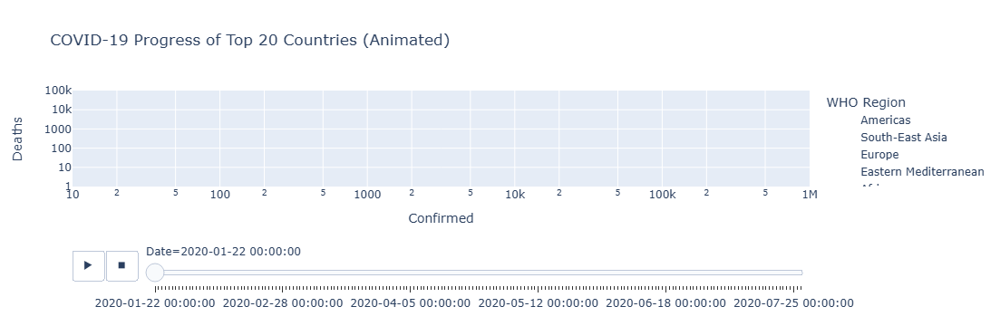

In [63]:
top_20_countries = full_grouped_clean.groupby('Country/Region')['Confirmed'].max().nlargest(20).index
top_20_data = full_grouped_clean[full_grouped_clean['Country/Region'].isin(top_20_countries)]

fig = px.scatter(top_20_data, x="Confirmed", y="Deaths", animation_frame="Date", animation_group="Country/Region",
                 size="Recovered", color="WHO Region", hover_name="Country/Region", 
                 log_x=True, log_y=True, size_max=60, range_x=[10,1000000], range_y=[1,100000],
                 title="COVID-19 Progress of Top 20 Countries (Animated)")

fig.show()

## Additional Visualizations

### Additional Visualizations (1)

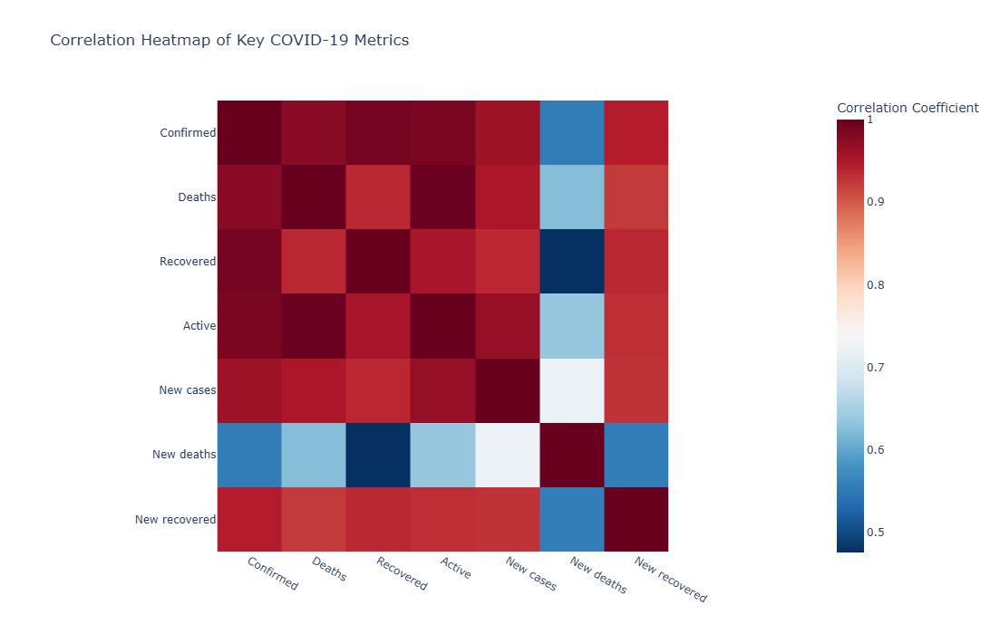

In [66]:
correlation_data = day_wise_clean[['Confirmed', 'Deaths', 'Recovered', 'Active', 'New cases', 'New deaths', 'New recovered']]
correlation_matrix = correlation_data.corr()

fig = px.imshow(correlation_matrix,
                labels=dict(color="Correlation Coefficient"),
                x=correlation_matrix.columns,
                y=correlation_matrix.columns,
                color_continuous_scale="RdBu_r",
                title="Correlation Heatmap of Key COVID-19 Metrics")

fig.update_layout(
    template='plotly_white',
    width=800,
    height=700,
)

fig.show()

### Additional Visualizations (2)

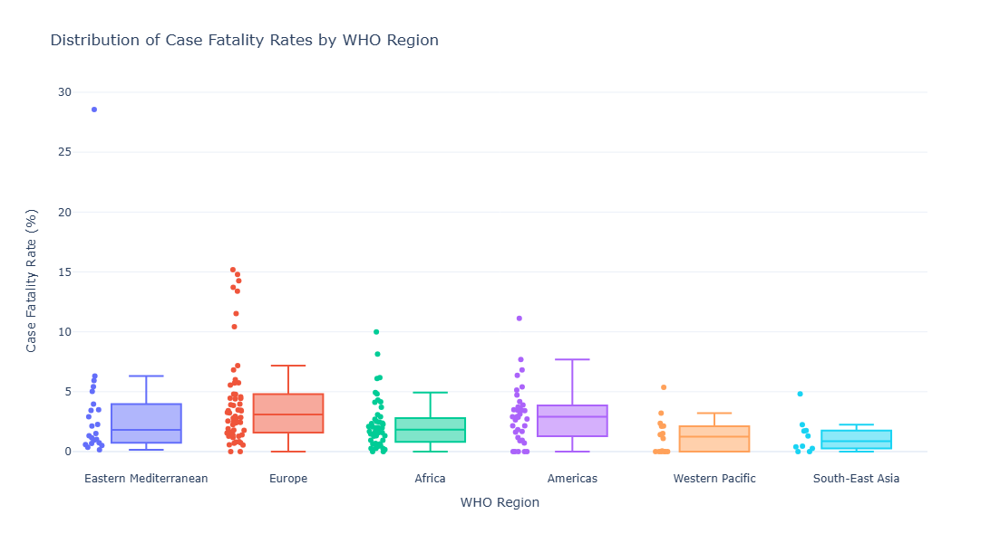

In [68]:
latest_data = full_grouped_clean.loc[full_grouped_clean.groupby('Country/Region')['Date'].idxmax()]

fig = px.box(latest_data, 
             x="WHO Region", 
             y="Case Fatality Rate",
             color="WHO Region",
             title="Distribution of Case Fatality Rates by WHO Region",
             labels={"Case Fatality Rate": "Case Fatality Rate (%)"},
             points="all")

fig.update_layout(
    template='plotly_white',
    xaxis_title="WHO Region",
    yaxis_title="Case Fatality Rate (%)",
    showlegend=False,
    width=1000,
    height=600,
)

fig.show()

### Additional Visualizations (3)

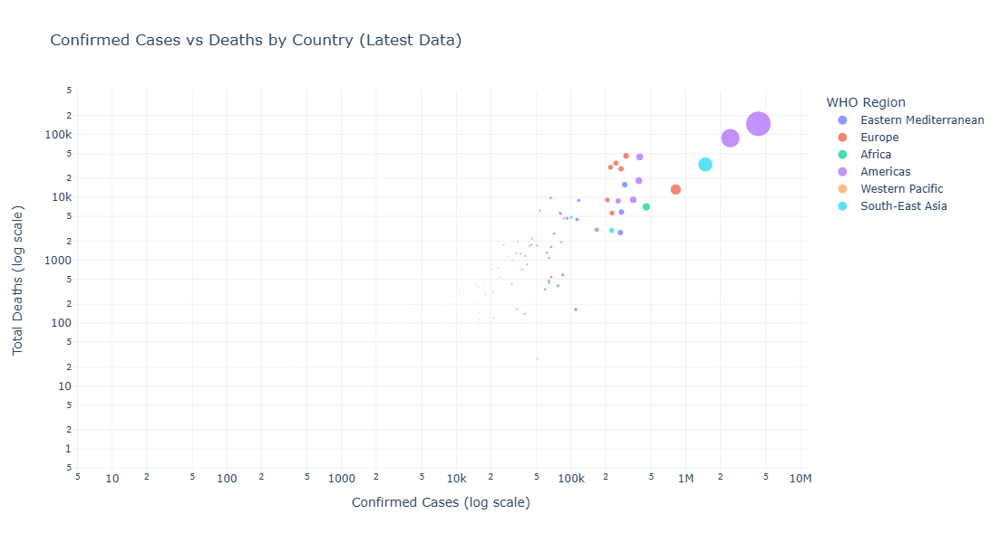

In [70]:
# 7.3 Scatter Plot of Confirmed Cases vs Deaths (log scale)
fig = px.scatter(latest_data, 
                 x="Confirmed", 
                 y="Deaths",
                 color="WHO Region",
                 size="Confirmed",
                 hover_name="Country/Region",
                 log_x=True,
                 log_y=True,
                 title="Confirmed Cases vs Deaths by Country (Latest Data)",
                 labels={"Confirmed": "Confirmed Cases", "Deaths": "Total Deaths"})

fig.update_layout(
    template='plotly_white',
    width=1000,
    height=600,
    xaxis_title="Confirmed Cases (log scale)",
    yaxis_title="Total Deaths (log scale)"
)

fig.show()

### Additional Visualizations (4)

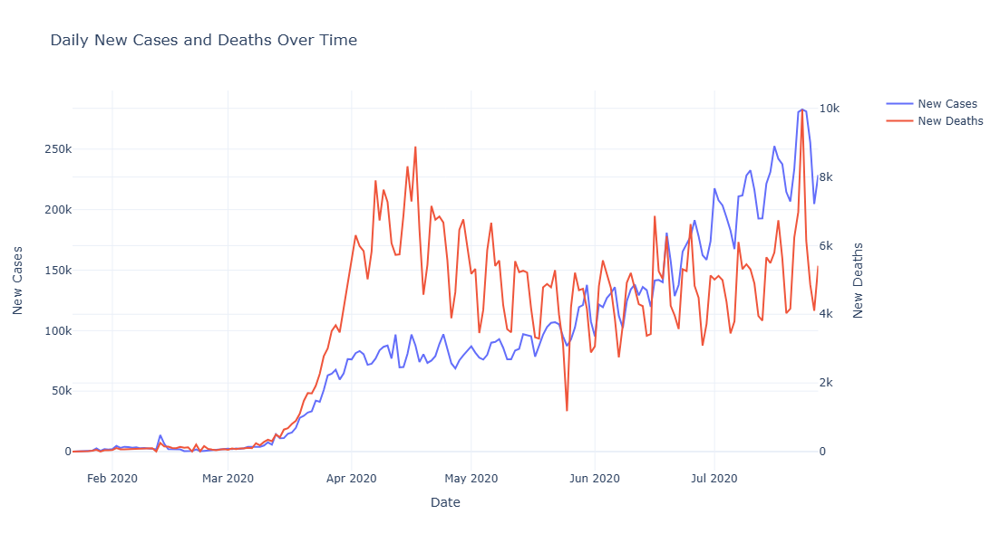

In [72]:
# 7.5 Dual-Axis Line Chart: Daily New Cases and Daily New Deaths
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(x=day_wise_clean['Date'], y=day_wise_clean['New cases'], name="New Cases"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=day_wise_clean['Date'], y=day_wise_clean['New deaths'], name="New Deaths"),
    secondary_y=True,
)

fig.update_layout(
    title_text="Daily New Cases and Deaths Over Time",
    template='plotly_white',
    width=1000,
    height=600,
)

fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="New Cases", secondary_y=False)
fig.update_yaxes(title_text="New Deaths", secondary_y=True)

fig.show()